# Correlations

My goal here was to find some correlations between some of the parameters. I opted to use a Pearson correlation. Since this is correlating the data globally, I do have some concerns that region-specific dynamics are glossed over. However, it may give some insight as to whether something like temperature or the degree of natural variability *generally* correlates with YOE, the rate of change in a given variable, or the absolute change in that variable.

In [3]:
from matplotlib import pyplot as plt
from matplotlib.dates import DateFormatter
import numpy as np
import xarray as xr
import pandas as pd
import scipy
from datetime import datetime, timedelta
import time
import seaborn as sns
import matplotlib.dates as mdates
import bottleneck as bn
import PyCO2SYS as pyco2
import gsw
import math
import netCDF4 as nc
import requests

# import chemO_funcs #import o2sat
from importlib import reload
import warnings
warnings.filterwarnings('ignore')
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
# %run ./chemO_funcs.py

# Open all the data

In [2]:
phgfdl = pd.read_csv('/Users/akbaskind/Desktop/YoE/phYOE_gfdl.csv')
omegagfdl = pd.read_csv('/Users/akbaskind/Desktop/YoE/omegaYOE_gfdl.csv')
fco2gfdl = pd.read_csv('/Users/akbaskind/Desktop/YoE/fco2YOE_gfdl.csv')

phbuoy = pd.read_csv('/Users/akbaskind/Desktop/YoE/phYOE_buoy.csv')
omegabuoy = pd.read_csv('/Users/akbaskind/Desktop/YoE/omegaYOE_buoy.csv')
fco2buoy = pd.read_csv('/Users/akbaskind/Desktop/YoE/fco2YOE_buoy.csv')

phsocat = pd.read_csv('/Users/akbaskind/Desktop/YoE/phYOE_091423.csv')
omegasocat = pd.read_csv('/Users/akbaskind/Desktop/YoE/omegaYOE_091423.csv')
fco2socat = pd.read_csv('/Users/akbaskind/Desktop/YoE/fco2YOE_091423.csv')

# Noise from GFDL-ESM4
## Omega

<AxesSubplot:title={'center':'Omega: Noise from GFDL-ESM4'}>

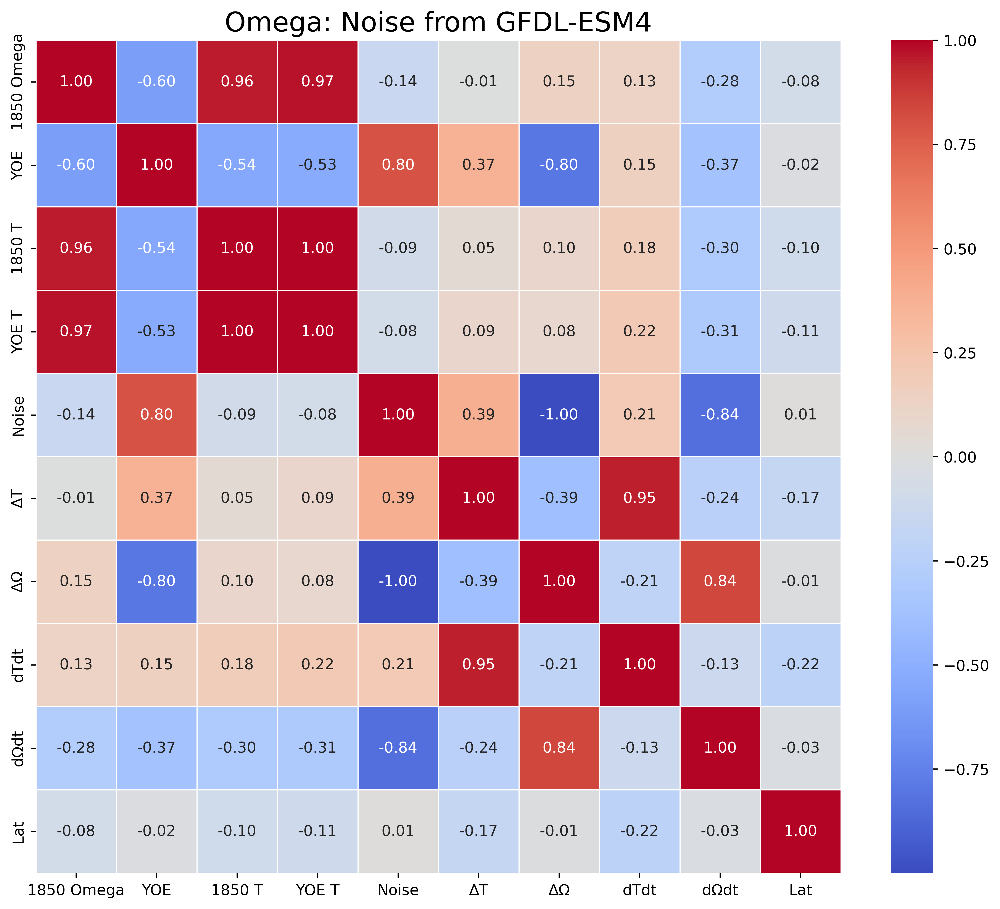

In [41]:
omega = omegagfdl
omega['∆T'] = omega['YOE T'] - omega['1850 T']
omega['dTdt'] = (omega['YOE T'] - omega['1850 T'])/(omega['YOE'] - 1850)
omega['∆Ω'] = omega['YOE Actual Omega from polynomial'] - omega['1850 Omega']
omega['dΩdt'] = (omega['YOE Actual Omega from polynomial'] - omega['1850 Omega'])/(omega['YOE'] - 1850)
O = omega[['1850 Omega', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆Ω', 'dTdt', 'dΩdt', 'Lat']]
corr = O.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('Omega: Noise from GFDL-ESM4', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm')

Omega, derived only from GFDL-ESM4, shows strong, positive correlations between
* YOE temperature + 1850 temperature
    * higher YOE temperature <--> higher 1850 temperature
    * All this really tells us is that if it started warm, it will still warm.
* YOE + Noise
    * Later YOE <--> larger variability
    * This confirms what we already know, but at least puts a number to it.


Omega, derived only from GFDL-ESM4, shows strong, negative correlations between
* YOE + ∆Ω
    * Later YOE <--> larger decrease in Ω
* noise + ∆Ω
    * greater variability <--> larger decrease in Ω
* noise + rate of change in Ω
    * greater variability <--> faster decrease in Ω

## pH

<AxesSubplot:title={'center':'pH: Noise from GFDL-ESM4'}>

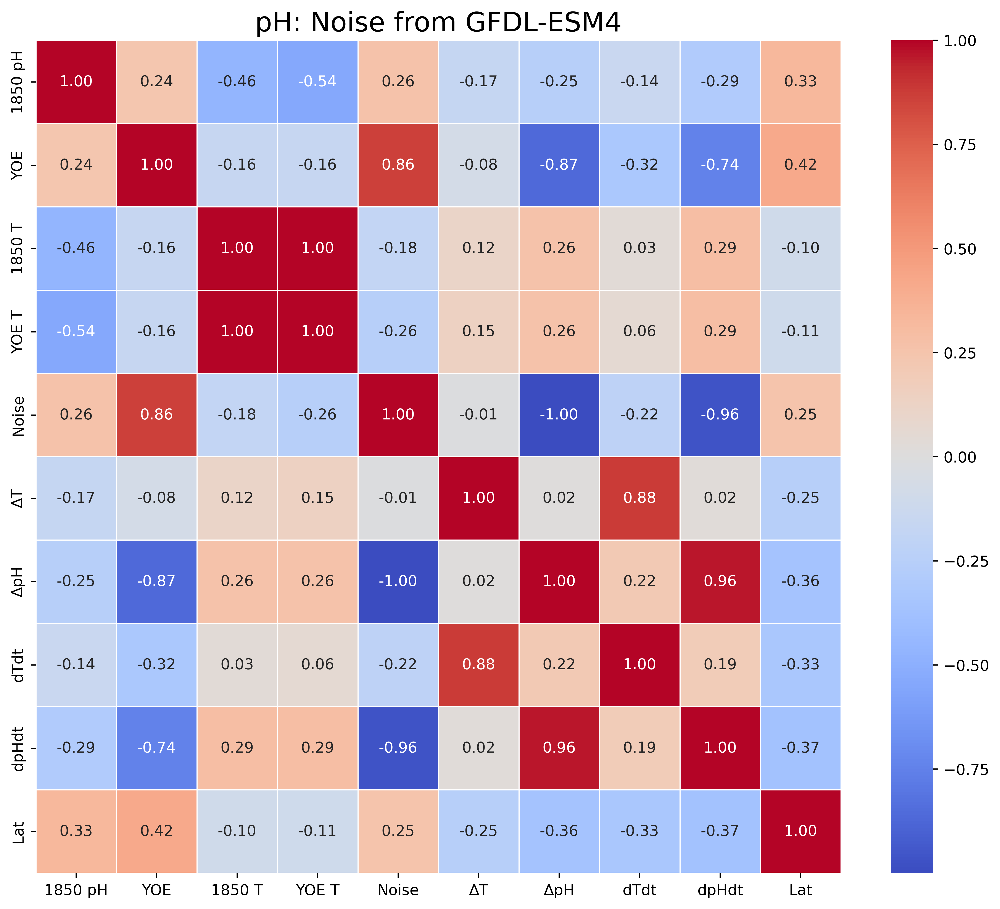

In [42]:
ph = phgfdl
ph['∆T'] = ph['YOE T'] - ph['1850 T']
ph['dTdt'] = (ph['YOE T'] - ph['1850 T'])/(ph['YOE'] - 1850)
ph['∆pH'] = ph['YOE Actual pH from polynomial'] - ph['1850 pH']
ph['dpHdt'] = (ph['YOE Actual pH from polynomial'] - ph['1850 pH'])/(ph['YOE'] - 1850)
P = ph[['1850 pH', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆pH', 'dTdt', 'dpHdt', 'Lat']]
corr = P.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('pH: Noise from GFDL-ESM4', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm')

## fCO$_{2}$

<AxesSubplot:title={'center':'fCO2: Noise from GFDL-ESM4'}>

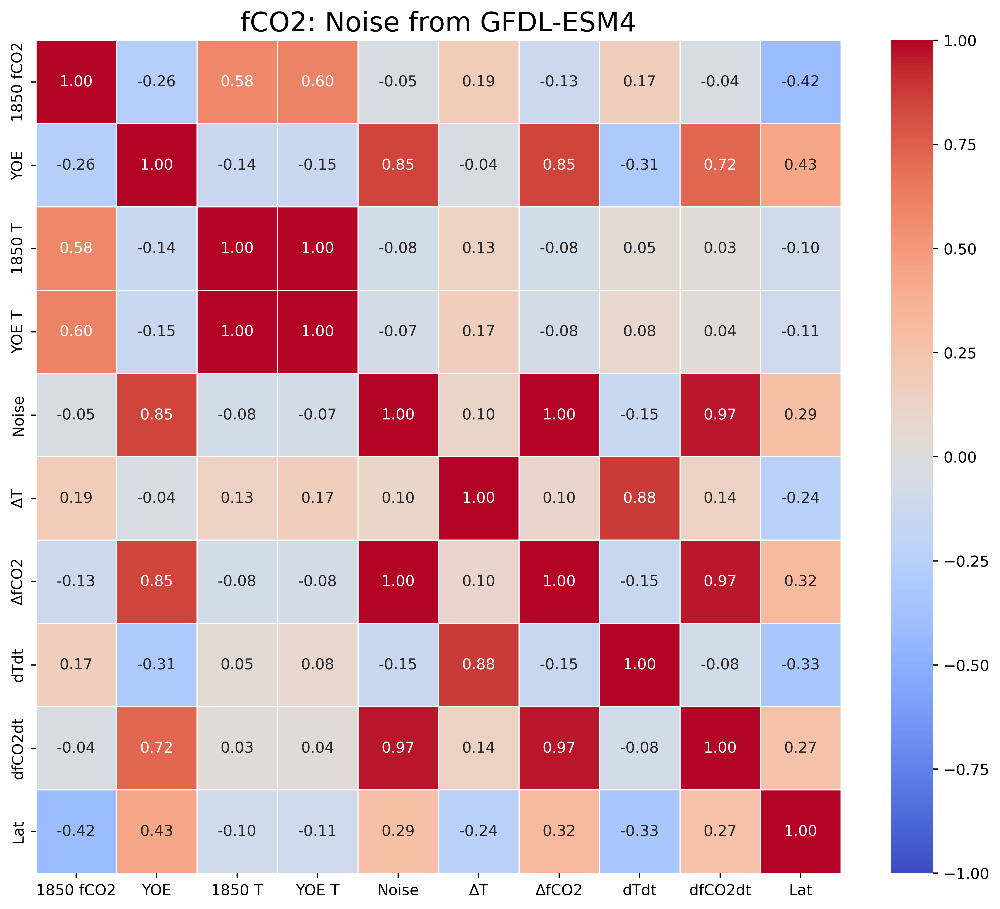

In [43]:
fco2 = fco2gfdl
fco2['∆T'] = fco2['YOE T'] - fco2['1850 T']
fco2['dTdt'] = (fco2['YOE T'] - fco2['1850 T'])/(fco2['YOE'] - 1850)
fco2['∆fCO2'] = fco2['YOE Actual fCO2 from polynomial'] - fco2['1850 fCO2']
fco2['dfCO2dt'] = (fco2['YOE Actual fCO2 from polynomial'] - fco2['1850 fCO2'])/(fco2['YOE'] - 1850)
F = fco2[['1850 fCO2', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆fCO2', 'dTdt', 'dfCO2dt', 'Lat']]
corr = F.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('fCO2: Noise from GFDL-ESM4', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

## ALL

<AxesSubplot:title={'center':'Noise from GFDL-ESM4'}>

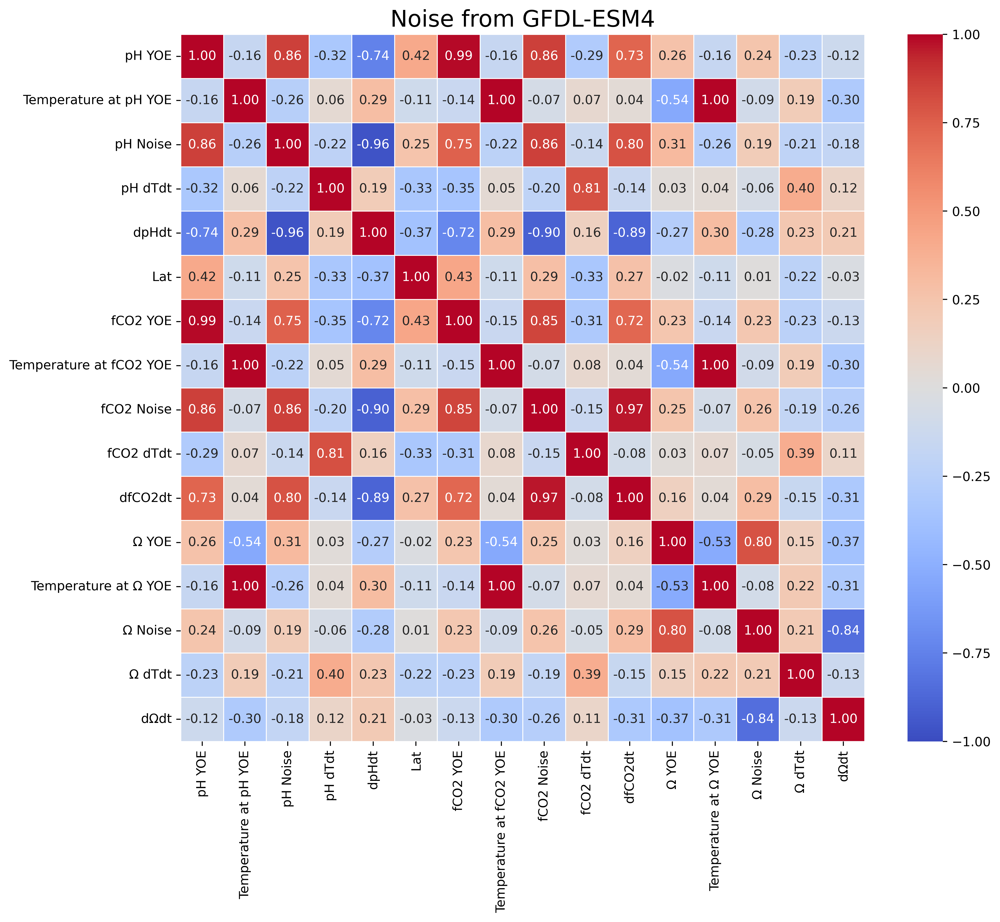

In [44]:
P = ph[['YOE', 'YOE T', 'Noise', 'dTdt', 'dpHdt', 'Lat']]
P = P.rename(columns={"YOE": "pH YOE", "YOE T": "Temperature at pH YOE", "Noise":"pH Noise",
                  "dTdt": "pH dTdt"})
F = fco2[['YOE','YOE T', 'Noise', 'dTdt', 'dfCO2dt']]
F = F.rename(columns={"YOE": "fCO2 YOE", "YOE T": "Temperature at fCO2 YOE", "Noise":"fCO2 Noise",
                  "dTdt": "fCO2 dTdt"})
O = omega[['YOE','YOE T', 'Noise', 'dTdt', 'dΩdt']]
O = O.rename(columns={"YOE": "Ω YOE", "YOE T": "Temperature at Ω YOE", "Noise":"Ω Noise",
                  "dTdt": "Ω dTdt"})
ALL = pd.concat([P, F, O], axis=1)
corr = ALL.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('Noise from GFDL-ESM4', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

# Noise adjusted to SOCAT

## Omega

<AxesSubplot:title={'center':'Omega: Noise adjusted to SOCAT'}>

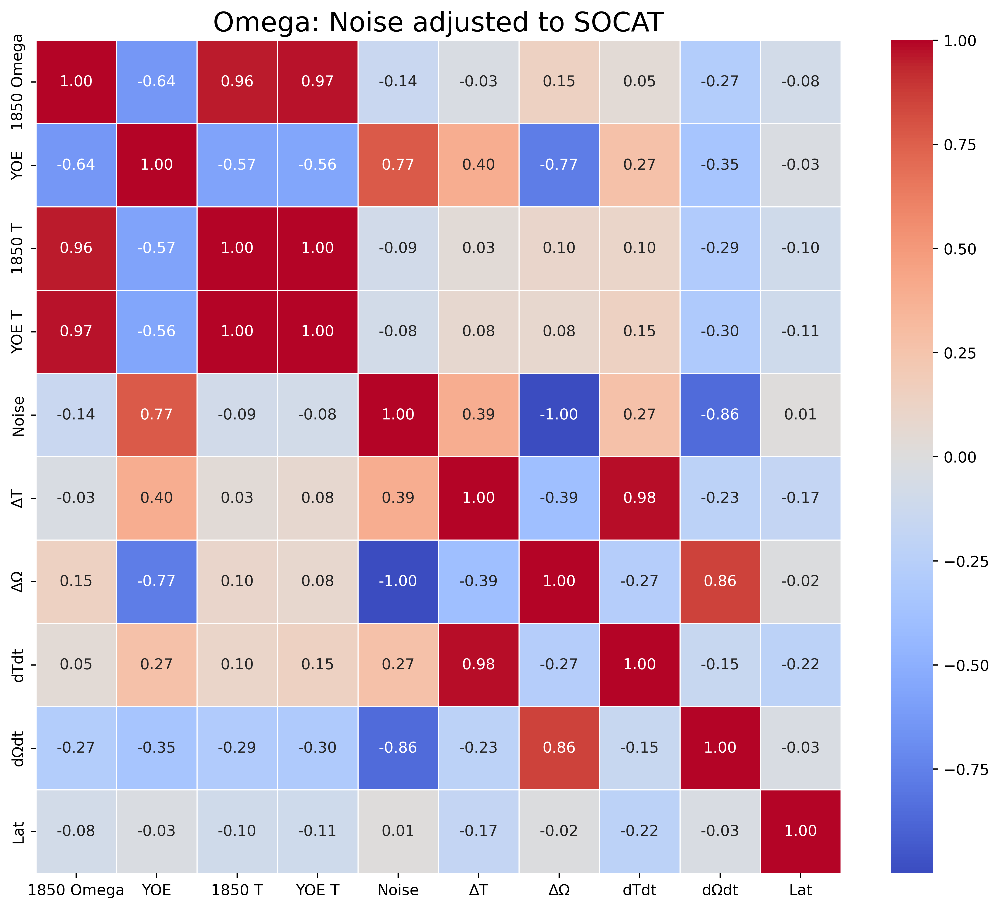

In [45]:
omega = omegasocat
omega['∆T'] = omega['YOE T'] - omega['1850 T']
omega['dTdt'] = (omega['YOE T'] - omega['1850 T'])/(omega['YOE'] - 1850)
omega['∆Ω'] = omega['YOE Actual Omega from polynomial'] - omega['1850 Omega']
omega['dΩdt'] = (omega['YOE Actual Omega from polynomial'] - omega['1850 Omega'])/(omega['YOE'] - 1850)
O = omega[['1850 Omega', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆Ω', 'dTdt', 'dΩdt', 'Lat']]
corr = O.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('Omega: Noise adjusted to SOCAT', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm')

## fCO$_2$

<AxesSubplot:title={'center':'fCO2: Noise adjusted to SOCAT'}>

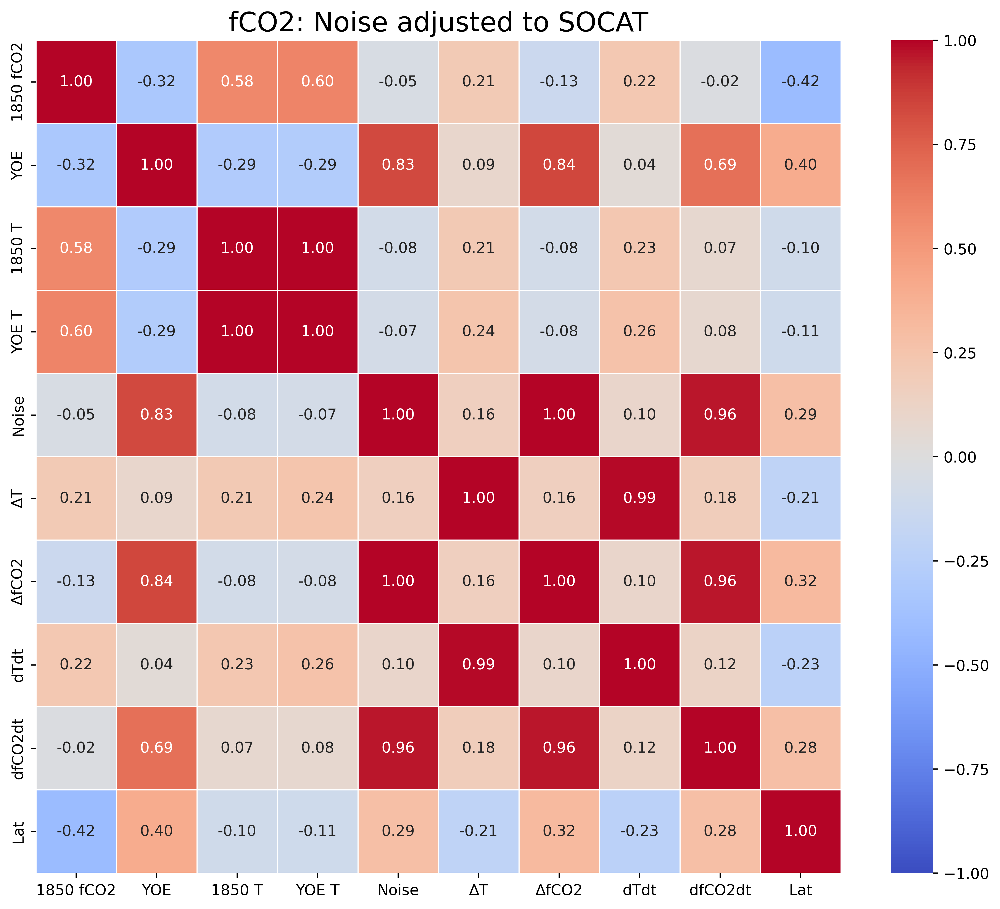

In [46]:
fco2 = fco2socat
fco2['∆T'] = fco2['YOE T'] - fco2['1850 T']
fco2['dTdt'] = (fco2['YOE T'] - fco2['1850 T'])/(fco2['YOE'] - 1850)
fco2['∆fCO2'] = fco2['YOE Actual fCO2 from polynomial'] - fco2['1850 fCO2']
fco2['dfCO2dt'] = (fco2['YOE Actual fCO2 from polynomial'] - fco2['1850 fCO2'])/(fco2['YOE'] - 1850)
F = fco2[['1850 fCO2', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆fCO2', 'dTdt', 'dfCO2dt', 'Lat']]
corr = F.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('fCO2: Noise adjusted to SOCAT', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

## pH

<AxesSubplot:title={'center':'pH: Noise adjusted to SOCAT'}>

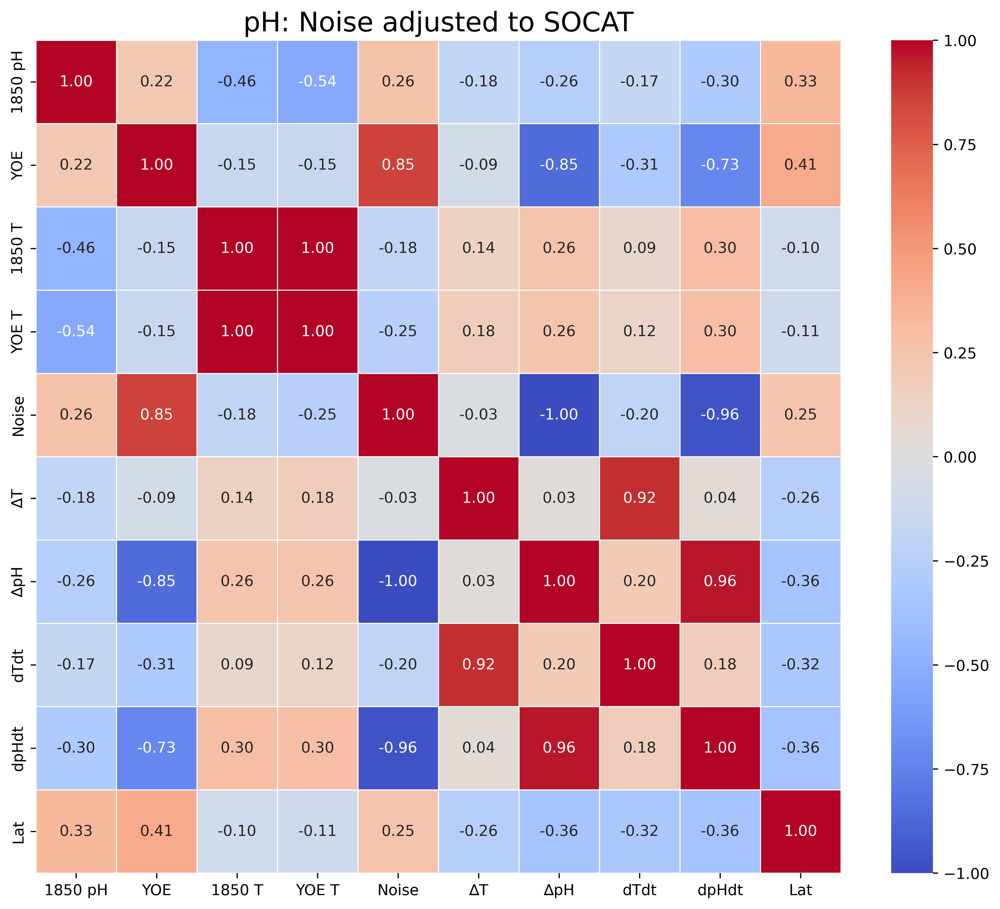

In [47]:
ph = phsocat
ph['∆T'] = ph['YOE T'] - ph['1850 T']
ph['dTdt'] = (ph['YOE T'] - ph['1850 T'])/(ph['YOE'] - 1850)
ph['∆pH'] = ph['YOE Actual pH from polynomial'] - ph['1850 pH']
ph['dpHdt'] = (ph['YOE Actual pH from polynomial'] - ph['1850 pH'])/(ph['YOE'] - 1850)
P = ph[['1850 pH', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆pH', 'dTdt', 'dpHdt', 'Lat']]
corr = P.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('pH: Noise adjusted to SOCAT', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

## ALL

<AxesSubplot:title={'center':'Noise adjusted to SOCAT'}>

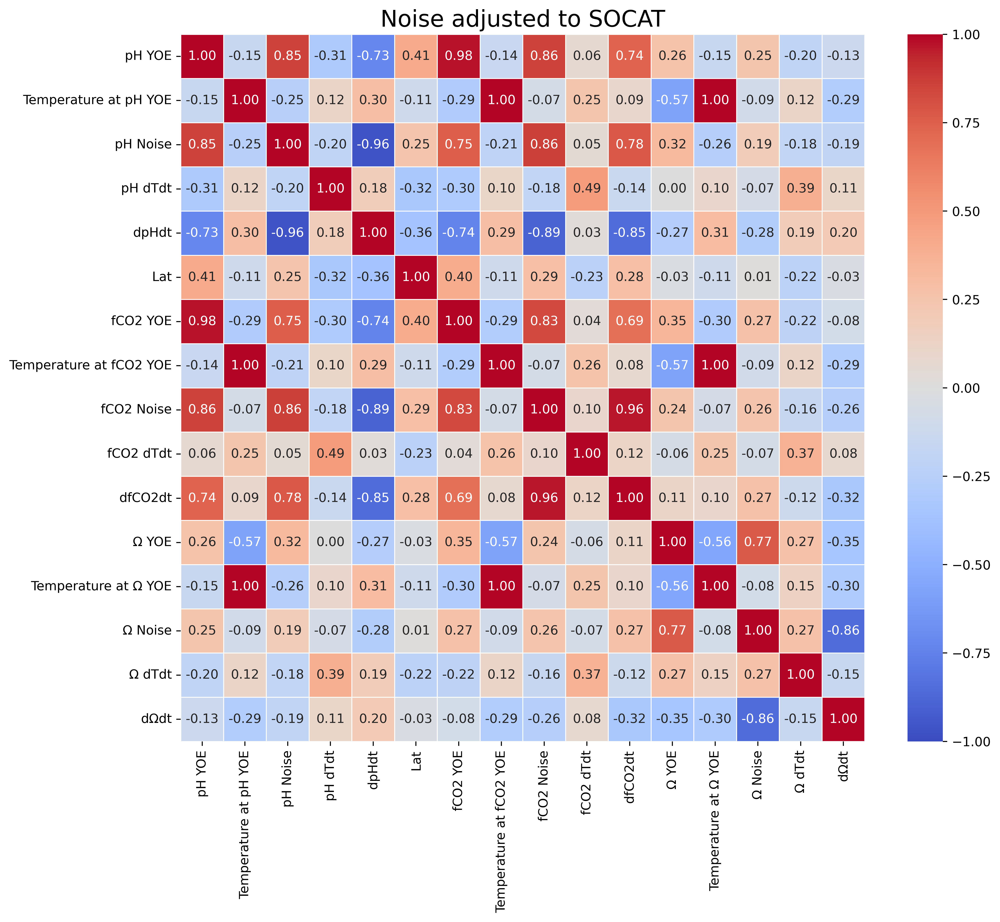

In [48]:
P = ph[['YOE', 'YOE T', 'Noise', 'dTdt', 'dpHdt', 'Lat']]
P = P.rename(columns={"YOE": "pH YOE", "YOE T": "Temperature at pH YOE", "Noise":"pH Noise",
                  "dTdt": "pH dTdt"})
F = fco2[['YOE','YOE T', 'Noise', 'dTdt', 'dfCO2dt']]
F = F.rename(columns={"YOE": "fCO2 YOE", "YOE T": "Temperature at fCO2 YOE", "Noise":"fCO2 Noise",
                  "dTdt": "fCO2 dTdt"})
O = omega[['YOE','YOE T', 'Noise', 'dTdt', 'dΩdt']]
O = O.rename(columns={"YOE": "Ω YOE", "YOE T": "Temperature at Ω YOE", "Noise":"Ω Noise",
                  "dTdt": "Ω dTdt"})
ALL = pd.concat([P, F, O], axis=1)
corr = ALL.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('Noise adjusted to SOCAT', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

# Noise adjusted to PMEL Buoys

## Omega

<AxesSubplot:title={'center':'Omega: Noise adjusted to PMEL Buoys'}>

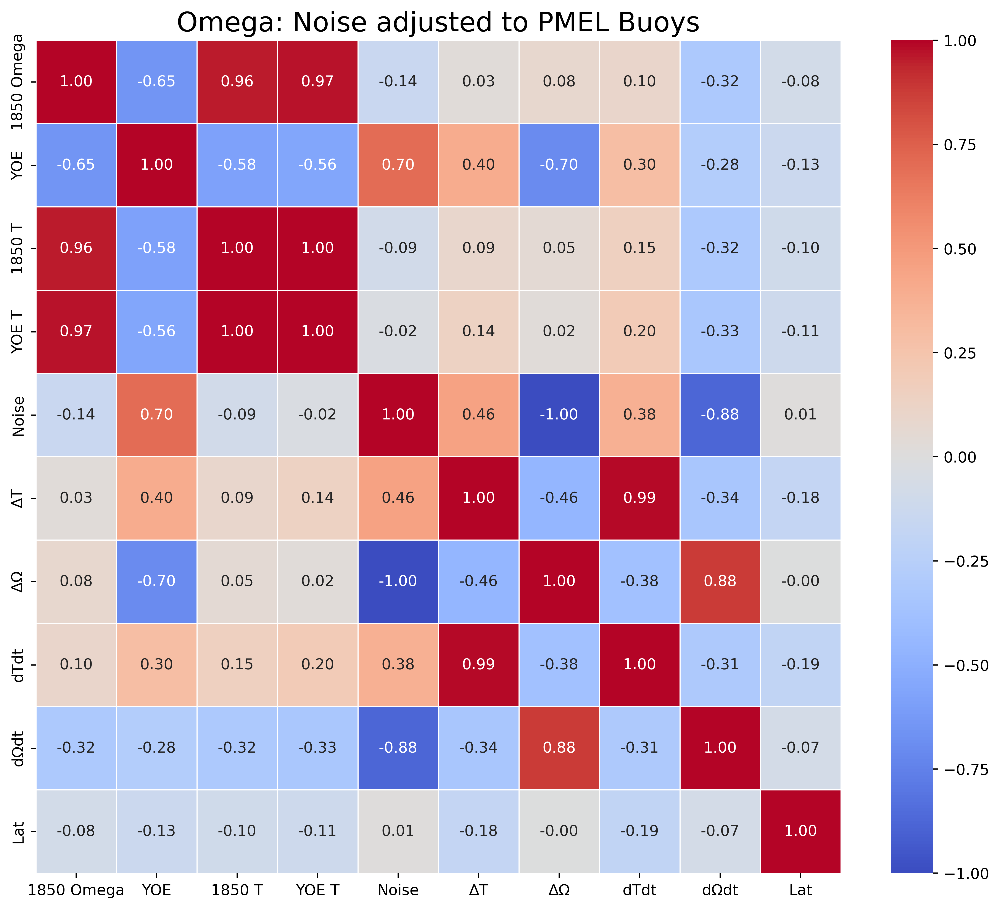

In [35]:
omega = omegabuoy
omega['∆T'] = omega['YOE T'] - omega['1850 T']
omega['dTdt'] = (omega['YOE T'] - omega['1850 T'])/(omega['YOE'] - 1850)
omega['∆Ω'] = omega['YOE Actual Omega from polynomial'] - omega['1850 Omega']
omega['dΩdt'] = (omega['YOE Actual Omega from polynomial'] - omega['1850 Omega'])/(omega['YOE'] - 1850)
O = omega[['1850 Omega', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆Ω', 'dTdt', 'dΩdt', 'Lat']]
corr = O.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('Omega: Noise adjusted to PMEL Buoys', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

## fCO$_2$

<AxesSubplot:title={'center':'fCO2: Noise adjusted to PMEL Buoys'}>

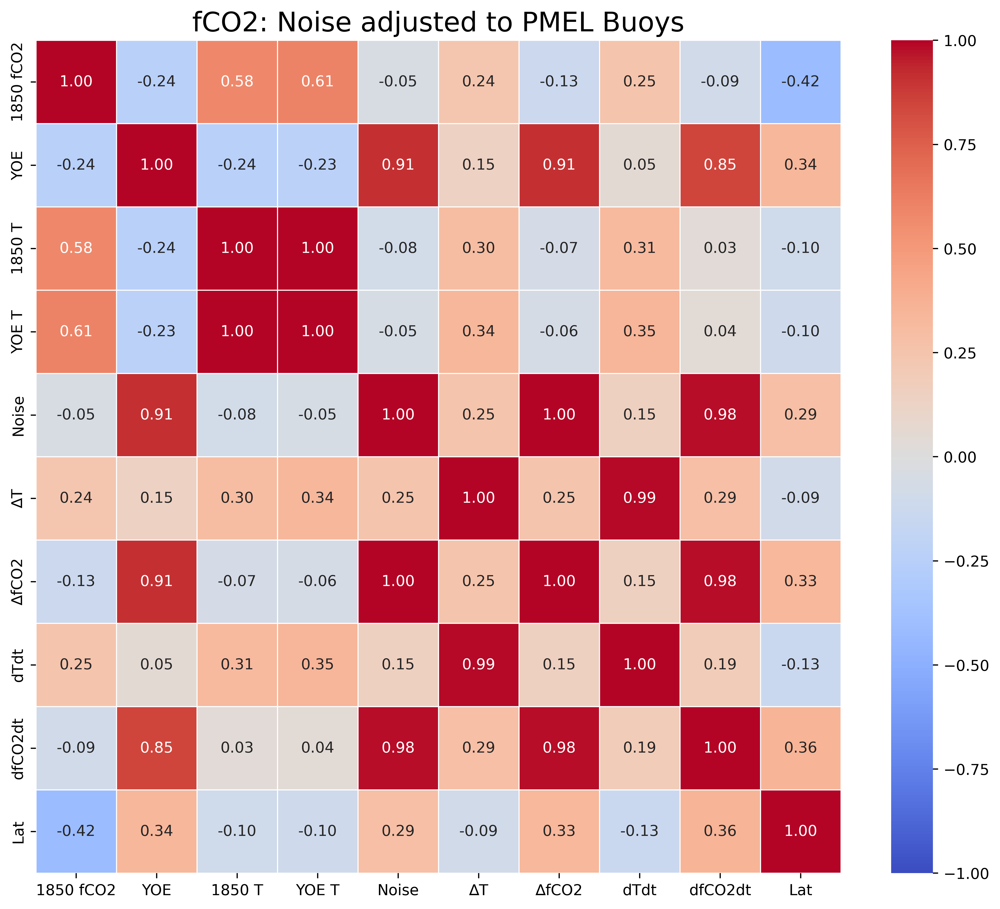

In [36]:
fco2 = fco2buoy
fco2['∆T'] = fco2['YOE T'] - fco2['1850 T']
fco2['dTdt'] = (fco2['YOE T'] - fco2['1850 T'])/(fco2['YOE'] - 1850)
fco2['∆fCO2'] = fco2['YOE Actual fCO2 from polynomial'] - fco2['1850 fCO2']
fco2['dfCO2dt'] = (fco2['YOE Actual fCO2 from polynomial'] - fco2['1850 fCO2'])/(fco2['YOE'] - 1850)
F = fco2[['1850 fCO2', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆fCO2', 'dTdt', 'dfCO2dt', 'Lat']]
corr = F.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('fCO2: Noise adjusted to PMEL Buoys', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

## pH

<AxesSubplot:title={'center':'pH: Noise adjusted to PMEL Buoys'}>

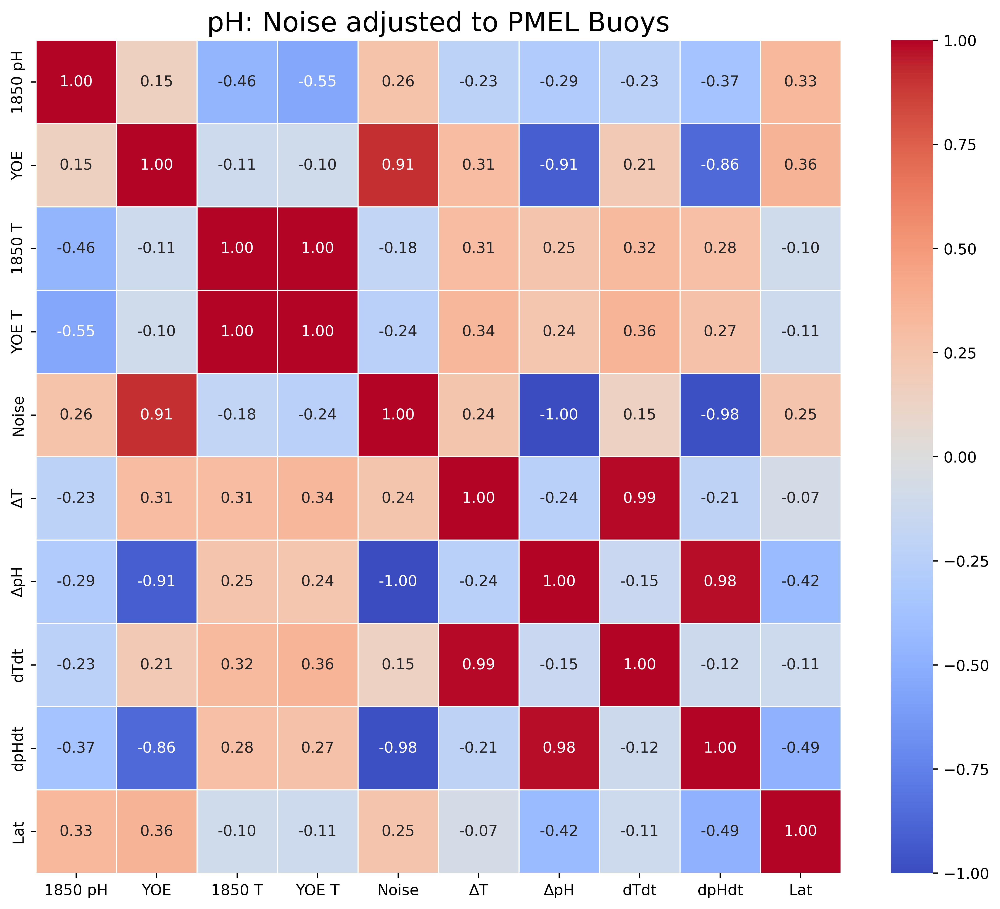

In [37]:
ph = phbuoy
ph['∆T'] = ph['YOE T'] - ph['1850 T']
ph['dTdt'] = (ph['YOE T'] - ph['1850 T'])/(ph['YOE'] - 1850)
ph['∆pH'] = ph['YOE Actual pH from polynomial'] - ph['1850 pH']
ph['dpHdt'] = (ph['YOE Actual pH from polynomial'] - ph['1850 pH'])/(ph['YOE'] - 1850)
P = ph[['1850 pH', 'YOE', '1850 T', 'YOE T', 'Noise',
       '∆T', '∆pH', 'dTdt', 'dpHdt', 'Lat']]
corr = P.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('pH: Noise adjusted to PMEL Buoys', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)

<AxesSubplot:title={'center':'Noise adjusted to PMEL Buoys'}>

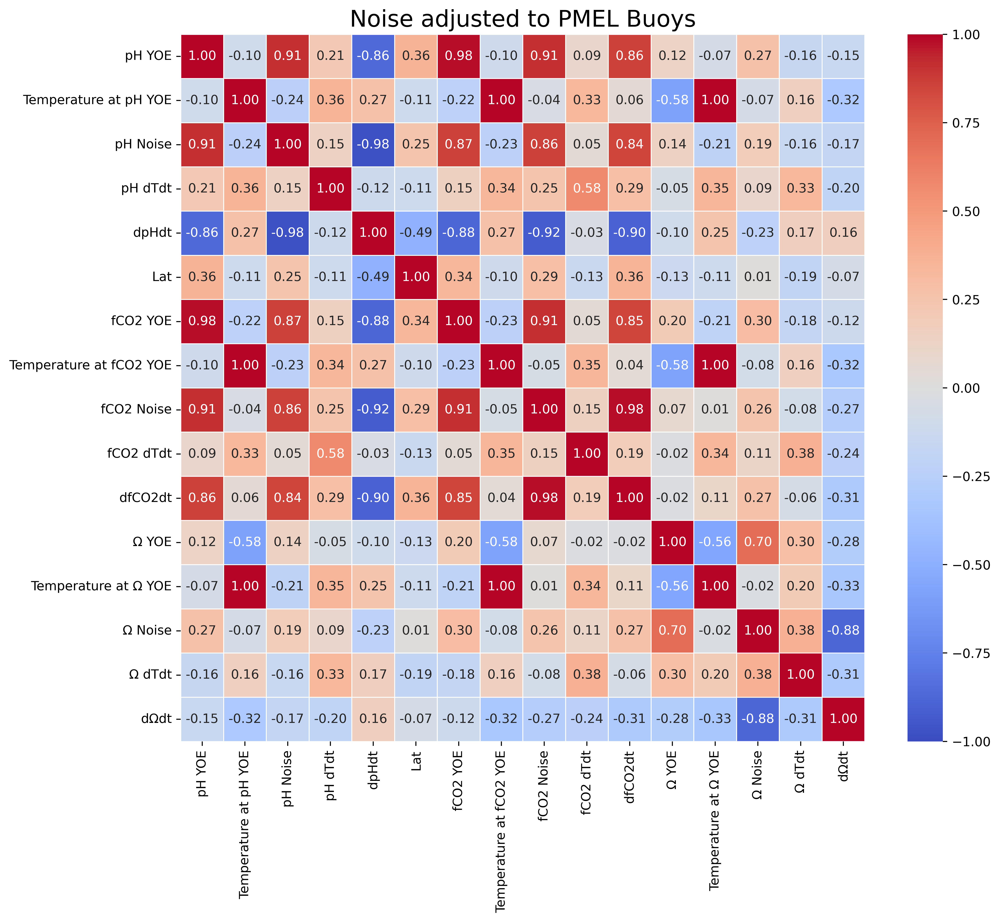

In [40]:
P = ph[['YOE', 'YOE T', 'Noise', 'dTdt', 'dpHdt', 'Lat']]
P = P.rename(columns={"YOE": "pH YOE", "YOE T": "Temperature at pH YOE", "Noise":"pH Noise",
                  "dTdt": "pH dTdt"})
F = fco2[['YOE','YOE T', 'Noise', 'dTdt', 'dfCO2dt']]
F = F.rename(columns={"YOE": "fCO2 YOE", "YOE T": "Temperature at fCO2 YOE", "Noise":"fCO2 Noise",
                  "dTdt": "fCO2 dTdt"})
O = omega[['YOE','YOE T', 'Noise', 'dTdt', 'dΩdt']]
O = O.rename(columns={"YOE": "Ω YOE", "YOE T": "Temperature at Ω YOE", "Noise":"Ω Noise",
                  "dTdt": "Ω dTdt"})
ALL = pd.concat([P, F, O], axis=1)
corr = ALL.corr(method = 'pearson')
plt.figure(figsize=(12,10), dpi =500)
plt.title('Noise adjusted to PMEL Buoys', fontsize = 18)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5, cmap = 'coolwarm', vmin = -1)